In [1]:
import pandas as pd
from pandas import Timestamp
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import ppscore as pps
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

C:\Users\I539756\.virtualenvs\202203_TabularPlaygroundSeries-g8exoSNA\lib\site-packages\statsmodels\tsa\base\tsa_model.py:7: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,
C:\Users\I539756\.virtualenvs\202203_TabularPlaygroundSeries-g8exoSNA\lib\site-packages\statsmodels\tsa\base\tsa_model.py:7: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,


In [2]:
train = pd.read_csv("Data/train.csv", index_col = 0)
train['time'] = pd.to_datetime(train['time'])
train.shape

(848835, 5)

In [3]:
train.head()

,time,x,y,direction,congestion
row_id,,,,,
0,1991-04-01,0,0,EB,70
1,1991-04-01,0,0,NB,49
2,1991-04-01,0,0,SB,24
3,1991-04-01,0,1,EB,18
4,1991-04-01,0,1,NB,60


## Data Understanding

In [4]:
train.time.min(), train.time.max()

(Timestamp('1991-04-01 00:00:00'), Timestamp('1991-09-30 11:40:00'))

In [5]:
train[train.time == Timestamp('1991-04-01 00:00:00')]

,time,x,y,direction,congestion
row_id,,,,,
0,1991-04-01,0,0,EB,70
1,1991-04-01,0,0,NB,49
2,1991-04-01,0,0,SB,24
3,1991-04-01,0,1,EB,18
4,1991-04-01,0,1,NB,60
...,...,...,...,...,...
60,1991-04-01,2,3,NB,64
61,1991-04-01,2,3,NE,30
62,1991-04-01,2,3,SB,70


In [6]:
train[train.time == Timestamp('1991-04-01 11:00:00')]

,time,x,y,direction,congestion
row_id,,,,,
2145,1991-04-01 11:00:00,0,0,EB,45
2146,1991-04-01 11:00:00,0,0,NB,30
2147,1991-04-01 11:00:00,0,0,SB,41
2148,1991-04-01 11:00:00,0,1,EB,27
2149,1991-04-01 11:00:00,0,1,NB,62
...,...,...,...,...,...
2205,1991-04-01 11:00:00,2,3,NB,62
2206,1991-04-01 11:00:00,2,3,NE,31
2207,1991-04-01 11:00:00,2,3,SB,71


In [7]:
train.describe()

,x,y,congestion
count,848835.000000,848835.000000,848835.000000
mean,1.138462,1.630769,47.815305
std,0.801478,1.089379,16.799392
min,0.000000,0.000000,0.000000
25%,0.000000,1.000000,35.000000
50%,1.000000,2.000000,47.000000
75%,2.000000,3.000000,60.000000
max,2.000000,3.000000,100.000000


In [8]:
train.direction.value_counts()

EB    156708
NB    156708
SB    156708
WB    143649
NE     91413
SW     91413
NW     26118
SE     26118
Name: direction, dtype: int64

In [30]:
train.groupby(["x", "y"]).direction.unique()

x  y
0  0                        [EB, NB, SB]
   1                    [EB, NB, SB, WB]
   2                    [EB, NB, SB, WB]
   3            [EB, NB, NE, SB, SW, WB]
1  0            [EB, NB, NE, SB, SW, WB]
   1                    [EB, NB, SB, WB]
   2            [EB, NB, NE, SB, SW, WB]
   3            [EB, NB, NE, SB, SW, WB]
2  0                    [EB, NB, SB, WB]
   1    [EB, NB, NE, NW, SB, SE, SW, WB]
   2    [EB, NB, NE, NW, SB, SE, SW, WB]
   3            [EB, NB, NE, SB, SW, WB]
Name: direction, dtype: object

In [38]:
train.direction.unique()

array(['EB', 'NB', 'SB', 'WB', 'NE', 'SW', 'NW', 'SE'], dtype=object)

## Feature Engineering

In [7]:
train['month'] = train.time.dt.month
train['day'] = train.time.dt.day
train['day_of_week'] = train.time.dt.day_of_week
train['is_weekend'] = train['day_of_week'] >= 5
train['hour'] = train.time.dt.hour
train['minute'] = train.time.dt.minute

n_minutes_1_day = 24*60
train['sin_time'] = np.sin(2*np.pi*(train['hour'] * 60 + train['minute'])/n_minutes_1_day)
train['cos_time'] = np.cos(2*np.pi*(train['hour'] * 60 + train['minute'])/n_minutes_1_day)

train['road_id'] = train['x'].astype(str) + train['y'].astype(str) + train['direction']

In [8]:
train

,time,x,y,direction,congestion,month,day,day_of_week,is_weekend,hour,minute,sin_time,cos_time,road_id
row_id,,,,,,,,,,,,,,
0,1991-04-01 00:00:00,0,0,EB,70,4,1,0,False,0,0,0.000000,1.000000,00EB
1,1991-04-01 00:00:00,0,0,NB,49,4,1,0,False,0,0,0.000000,1.000000,00NB
2,1991-04-01 00:00:00,0,0,SB,24,4,1,0,False,0,0,0.000000,1.000000,00SB
3,1991-04-01 00:00:00,0,1,EB,18,4,1,0,False,0,0,0.000000,1.000000,01EB
4,1991-04-01 00:00:00,0,1,NB,60,4,1,0,False,0,0,0.000000,1.000000,01NB
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
848830,1991-09-30 11:40:00,2,3,NB,54,9,30,0,False,11,40,0.087156,-0.996195,23NB
848831,1991-09-30 11:40:00,2,3,NE,28,9,30,0,False,11,40,0.087156,-0.996195,23NE
848832,1991-09-30 11:40:00,2,3,SB,68,9,30,0,False,11,40,0.087156,-0.996195,23SB


<AxesSubplot:xlabel='time', ylabel='sin_time'>

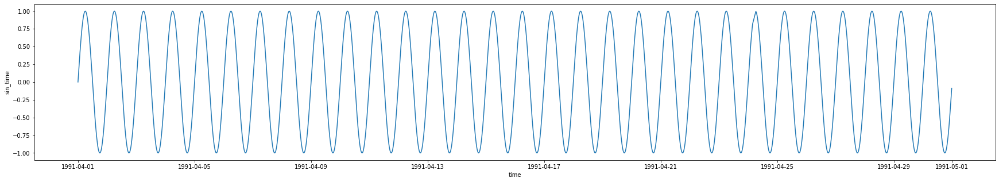

In [71]:
plt.figure(figsize=(30, 5))
sns.lineplot(data = train[(train.road_id == '00EB') & (train.month == 4)], x = 'time', y = 'sin_time')

<AxesSubplot:xlabel='time', ylabel='cos_time'>

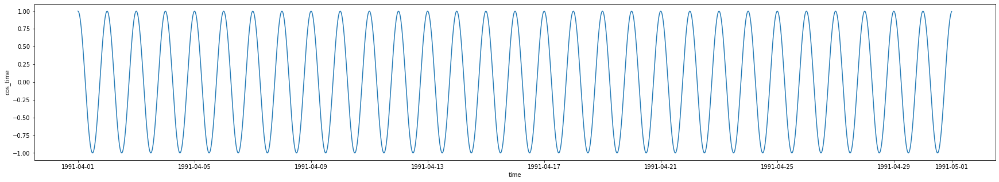

In [68]:
plt.figure(figsize=(30, 5))
sns.lineplot(data = train[(train.road_id == '00EB') & (train.month == 4)], x = 'time', y = 'cos_time')

# Distribution of congestion

<AxesSubplot:xlabel='day_of_week', ylabel='congestion'>

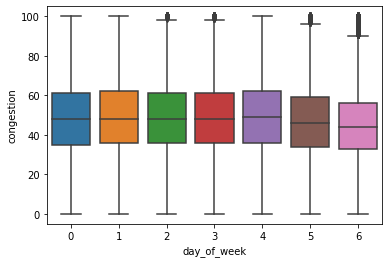

In [38]:
sns.boxplot(data = train, x = 'day_of_week', y = 'congestion')

<AxesSubplot:xlabel='hour', ylabel='congestion'>

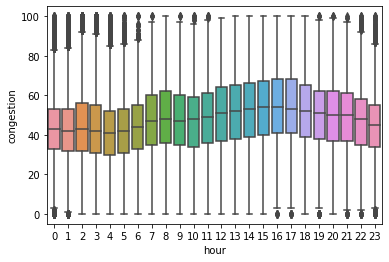

In [39]:
sns.boxplot(data = train, x = 'hour', y = 'congestion')

<AxesSubplot:xlabel='direction', ylabel='congestion'>

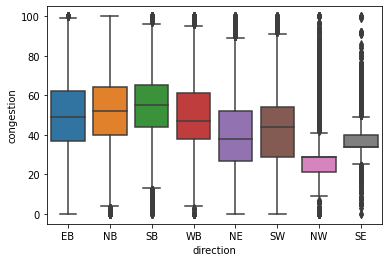

In [40]:
sns.boxplot(data = train, x = 'direction', y = 'congestion')

<AxesSubplot:xlabel='congestion', ylabel='Count'>

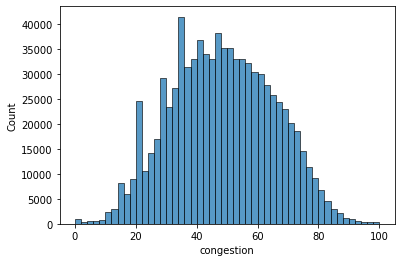

In [77]:
sns.histplot(train.congestion, bins = 50)

In [10]:
temp = train.groupby([train.time.dt.weekday.astype(str), train.time.dt.hour.astype(str), train.time.dt.minute.astype(str)]).congestion.mean()
temp.index = temp.index.map(":".join)
temp = temp.reset_index().sort_values('index')

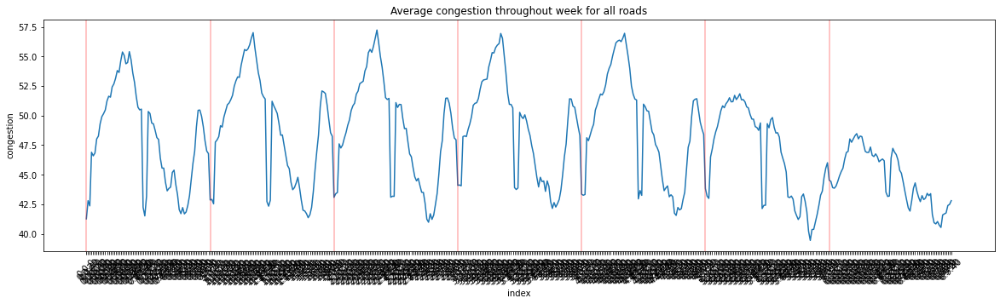

In [13]:
plt.figure(figsize=(20, 5))
sns.lineplot(data = temp, x = 'index', y = 'congestion')
plt.xticks(rotation = 45)
plt.title("Average congestion throughout week for all roads")
for i in range(7):
    plt.axvline(str(i) + ":0:0", color = 'red', alpha = 0.3)

row_id
0           0:0:0
1           0:0:0
2           0:0:0
3           0:0:0
4           0:0:0
           ...   
848830    0:11:40
848831    0:11:40
848832    0:11:40
848833    0:11:40
848834    0:11:40
Length: 848835, dtype: object

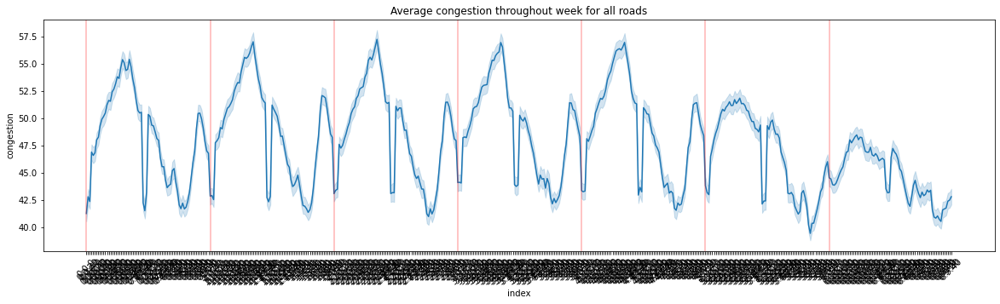

In [20]:
temp = train.copy()
temp.index = pd.DataFrame([train.time.dt.weekday.astype(str), train.time.dt.hour.astype(str), train.time.dt.minute.astype(str)]).apply(":".join, axis = 0)
temp = temp.congestion.reset_index().sort_values('index')

plt.figure(figsize=(20, 5))
sns.lineplot(data = temp, x = 'index', y = 'congestion')
plt.xticks(rotation = 45)
plt.title("Average congestion throughout week for all roads")
for i in range(7):
    plt.axvline(str(i) + ":0:0", color = 'red', alpha = 0.3)

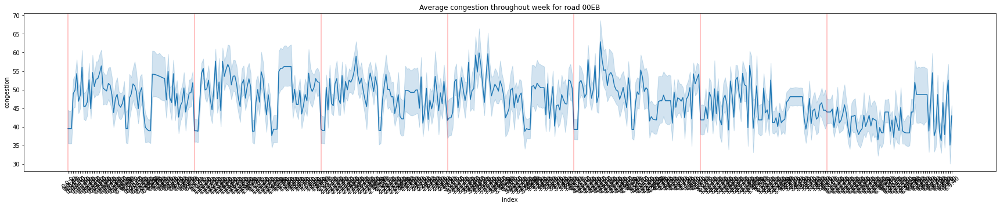

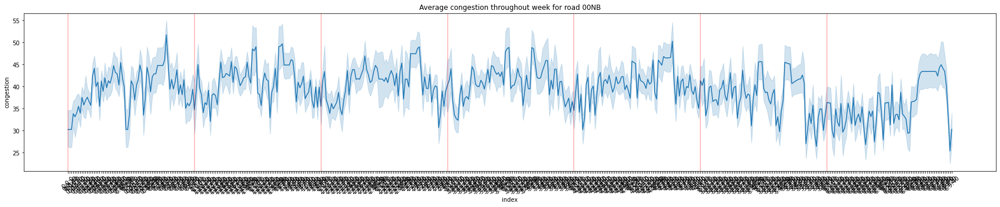

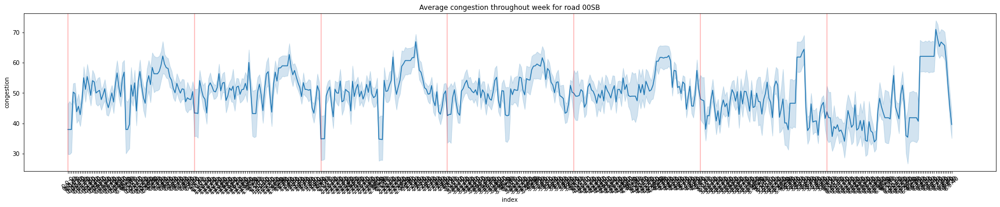

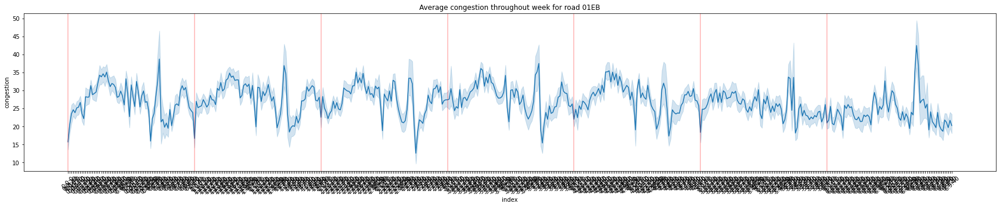

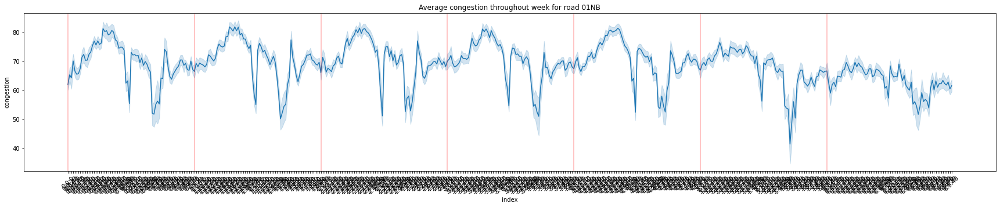

...

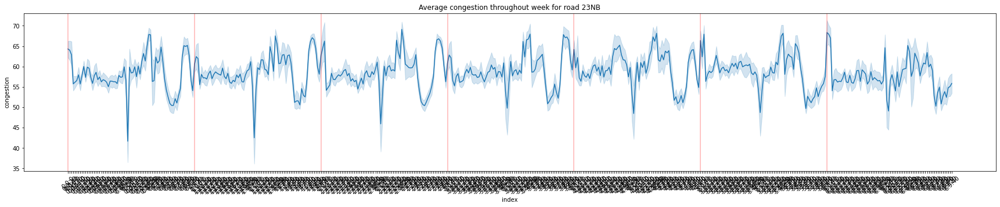

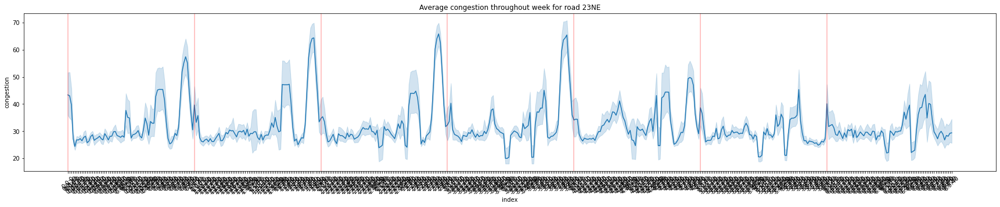

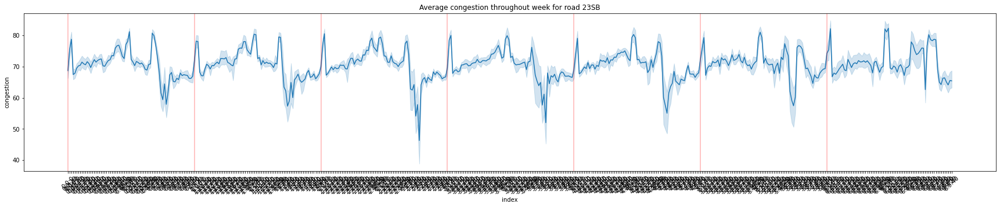

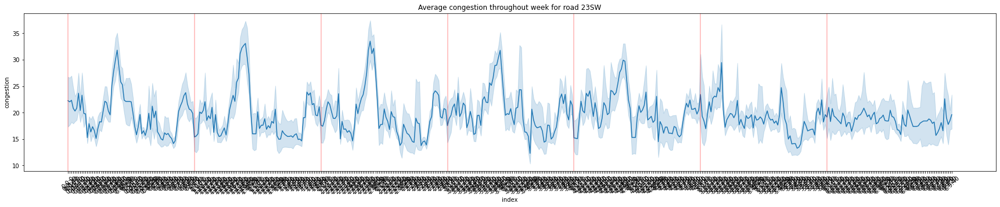

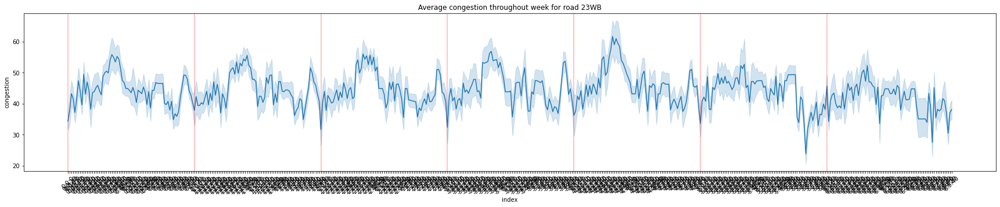

In [21]:
for road_id in train.road_id.unique():
    temp = train[train.road_id == road_id].copy()
    temp.index = pd.DataFrame([temp.time.dt.weekday.astype(str), temp.time.dt.hour.astype(str), temp.time.dt.minute.astype(str)]).apply(":".join, axis = 0)
    temp = temp.congestion.reset_index().sort_values('index')
    
    plt.figure(figsize=(30, 5))
    sns.lineplot(data = temp, x = 'index', y = 'congestion')
    plt.xticks(rotation = 45)
    plt.title(f"Average congestion throughout week for road {road_id}")
    
    for i in range(7):
        plt.axvline(str(i) + ":0:0", color = 'red', alpha = 0.3)
    
    plt.show()

## Autocorrelation per road

C:\Users\I539756\.virtualenvs\202203_TabularPlaygroundSeries-g8exoSNA\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


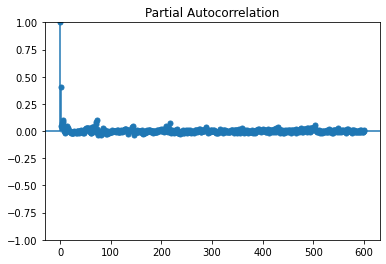

In [23]:
g = plot_pacf(train[train.road_id == '01EB'].congestion, lags = 600)

One day = 72 lags.

One week = 504 lags.

## Power Predictive Score

In [75]:
predictive_score = pps.predictors(train, "congestion")
predictive_score

,x,y,ppscore,case,is_valid_score,metric,baseline_score,model_score,model
0,road_id,congestion,0.390499,regression,True,mean absolute error,14.1106,8.600431,DecisionTreeRegressor()
1,direction,congestion,0.082047,regression,True,mean absolute error,14.1106,12.952866,DecisionTreeRegressor()
2,hour,congestion,0.023497,regression,True,mean absolute error,14.1106,13.779042,DecisionTreeRegressor()
3,y,congestion,0.023222,regression,True,mean absolute error,14.1106,13.782927,DecisionTreeRegressor()
4,x,congestion,0.013894,regression,True,mean absolute error,14.1106,13.914546,DecisionTreeRegressor()
5,cos_time,congestion,0.006958,regression,True,mean absolute error,14.1106,14.012417,DecisionTreeRegressor()
6,sin_time,congestion,0.006193,regression,True,mean absolute error,14.1106,14.023220,DecisionTreeRegressor()
7,is_weekend,congestion,0.004493,regression,True,mean absolute error,14.1106,14.047206,DecisionTreeRegressor()
8,day_of_week,congestion,0.003478,regression,True,mean absolute error,14.1106,14.061520,DecisionTreeRegressor()
9,time,congestion,0.000000,regression,True,mean absolute error,14.1106,18.643183,DecisionTreeRegressor()


## Is the congestion in different roads correlated?

In [82]:
train_wide_format = train.pivot(index = 'time', columns = 'road_id', values = 'congestion')
train_wide_format

road_id,00EB,00NB,00SB,01EB,01NB,01SB,01WB,02EB,02NB,02SB,...,22SB,22SE,22SW,22WB,23EB,23NB,23NE,23SB,23SW,23WB
time,,,,,,,,,,,,,,,,,,,,,
1991-04-01 00:00:00,70,49,24,18,60,58,26,31,49,46,...,36,51,47,51,39,64,30,70,29,26
1991-04-01 00:20:00,70,49,24,26,64,55,57,41,40,46,...,10,51,50,58,33,67,30,80,29,57
1991-04-01 00:40:00,70,49,24,31,51,57,91,42,41,35,...,32,51,49,63,33,64,30,79,29,48
1991-04-01 01:00:00,70,49,24,36,51,46,49,39,44,58,...,60,51,49,52,33,33,30,77,29,44
1991-04-01 01:20:00,70,49,24,29,53,83,62,36,46,46,...,43,51,49,50,33,50,30,79,29,44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1991-09-30 10:20:00,43,29,60,23,63,61,42,47,51,56,...,66,20,50,70,90,53,29,68,22,49
1991-09-30 10:40:00,47,28,35,24,62,63,32,44,57,65,...,60,21,49,68,45,52,25,70,20,47
1991-09-30 11:00:00,40,31,53,22,65,58,38,44,60,62,...,58,27,53,68,44,58,29,69,19,37


In [84]:
pps_between_roads = pps.matrix(train_wide_format)

In [88]:
pps_between_roads[pps_between_roads.case != 'predict_itself'].sort_values('ppscore', ascending = False).head(20)

,x,y,ppscore,case,is_valid_score,metric,baseline_score,model_score,model
3822,22WB,22NB,0.342030,regression,True,mean absolute error,11.5410,7.593627,DecisionTreeRegressor()
3438,22NB,22WB,0.341452,regression,True,mean absolute error,9.2526,6.093278,DecisionTreeRegressor()
3825,22WB,22SB,0.336292,regression,True,mean absolute error,11.8776,7.883255,DecisionTreeRegressor()
3633,22SB,22WB,0.333700,regression,True,mean absolute error,9.2526,6.165004,DecisionTreeRegressor()
3821,22WB,22EB,0.333026,regression,True,mean absolute error,11.3564,7.574429,DecisionTreeRegressor()
3626,22SB,22EB,0.332516,regression,True,mean absolute error,11.3564,7.580211,DecisionTreeRegressor()
3373,22EB,22WB,0.330145,regression,True,mean absolute error,9.2526,6.197899,DecisionTreeRegressor()
3370,22EB,22SB,0.321986,regression,True,mean absolute error,11.8776,8.053178,DecisionTreeRegressor()
3431,22NB,22EB,0.320999,regression,True,mean absolute error,11.3564,7.711006,DecisionTreeRegressor()
1806,12EB,22EB,0.310677,regression,True,mean absolute error,11.3564,7.828230,DecisionTreeRegressor()


y,00EB,00NB,00SB,01EB,01NB,01SB,01WB,02EB,02NB,02SB,...,22SB,22SE,22SW,22WB,23EB,23NB,23NE,23SB,23SW,23WB
x,,,,,,,,,,,,,,,,,,,,,
00EB,1.000000,0.001986,0.000000,0.003430,0.006723,0.002382,0.000000,0.002909,0.038622,0.032300,...,0.027868,0.0,0.000000,0.029496,0.000000,0.000000,0.0,0.000000,0.0,0.000000
00NB,0.000000,1.000000,0.008808,0.000328,0.016113,0.002187,0.000000,0.000000,0.009687,0.011680,...,0.005368,0.0,0.000000,0.011473,0.000000,0.000000,0.0,0.000000,0.0,0.000000
00SB,0.001561,0.005629,1.000000,0.000000,0.016602,0.030349,0.000000,0.033794,0.046814,0.062941,...,0.057030,0.0,0.008154,0.093880,0.007548,0.000000,0.0,0.010556,0.0,0.000000
01EB,0.000000,0.000000,0.000000,1.000000,0.062091,0.031214,0.034324,0.030053,0.077693,0.078048,...,0.084700,0.0,0.016558,0.092937,0.007239,0.000000,0.0,0.000000,0.0,0.010232
01NB,0.007390,0.024868,0.000000,0.066729,1.000000,0.133154,0.050649,0.063143,0.153961,0.121833,...,0.138185,0.0,0.032117,0.179903,0.020293,0.000000,0.0,0.012315,0.0,0.013801
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23NB,0.000000,0.000000,0.000000,0.000977,0.013941,0.000000,0.001788,0.015260,0.026543,0.027300,...,0.032294,0.0,0.000000,0.048328,0.000000,1.000000,0.0,0.014887,0.0,0.000269
23NE,0.000000,0.002690,0.000000,0.005931,0.035408,0.020040,0.000000,0.035629,0.075744,0.087447,...,0.108842,0.0,0.049986,0.140101,0.021268,0.036275,1.0,0.016050,0.0,0.000000
23SB,0.000000,0.006706,0.000000,0.012261,0.034176,0.008706,0.015553,0.033293,0.051854,0.059848,...,0.082481,0.0,0.013542,0.105002,0.003630,0.000000,0.0,1.000000,0.0,0.001976


<AxesSubplot:xlabel='y', ylabel='x'>

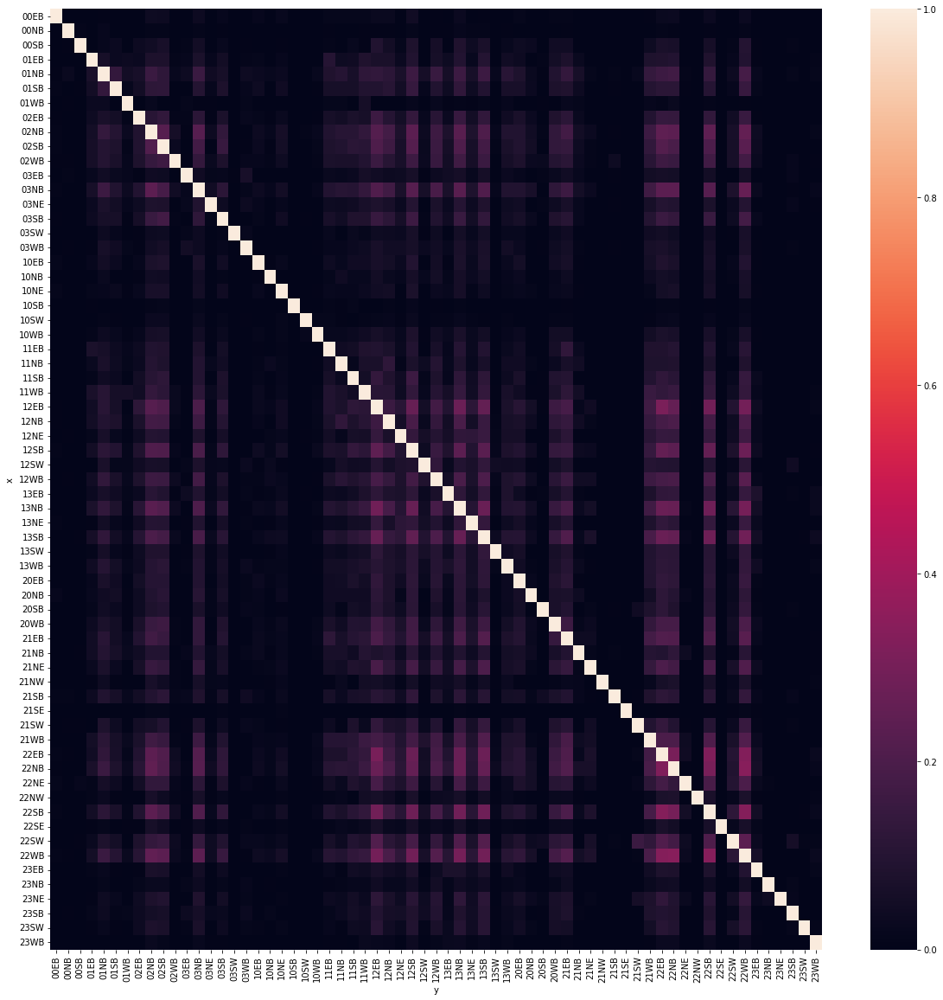

In [90]:
plt.figure(figsize=(20, 20))
sns.heatmap(pps_between_roads.pivot(index = 'x', columns = 'y', values = 'ppscore'))

In [96]:
road0 = train[train.road_id == '12EB'].set_index('time').congestion.copy()
road1 = train[train.road_id == '22EB'].set_index('time').congestion.copy()

road0

time
1991-04-01 00:00:00    53
1991-04-01 00:20:00    41
1991-04-01 00:40:00    34
1991-04-01 01:00:00    42
1991-04-01 01:20:00    55
                       ..
1991-09-30 10:20:00    59
1991-09-30 10:40:00    72
1991-09-30 11:00:00    68
1991-09-30 11:20:00    62
1991-09-30 11:40:00    76
Name: congestion, Length: 13059, dtype: int64

In [97]:
road0.shift(1)

time
1991-04-01 00:00:00     NaN
1991-04-01 00:20:00    53.0
1991-04-01 00:40:00    41.0
1991-04-01 01:00:00    34.0
1991-04-01 01:20:00    42.0
                       ... 
1991-09-30 10:20:00    60.0
1991-09-30 10:40:00    59.0
1991-09-30 11:00:00    72.0
1991-09-30 11:20:00    68.0
1991-09-30 11:40:00    62.0
Name: congestion, Length: 13059, dtype: float64

In [99]:
from scipy.stats import spearmanr
temp = road1.shift(0)
spearmanr(road0[~temp.isnull()], temp[~temp.isnull()])

SpearmanrResult(correlation=0.706417195010233, pvalue=0.0)

In [100]:
from scipy.stats import spearmanr
temp = road1.shift(1)
spearmanr(road0[~temp.isnull()], temp[~temp.isnull()])

SpearmanrResult(correlation=0.6668655731909983, pvalue=0.0)

In [101]:
from scipy.stats import spearmanr
temp = road1.shift(3)
spearmanr(road0[~temp.isnull()], temp[~temp.isnull()])

SpearmanrResult(correlation=0.6036085642279484, pvalue=0.0)

In [102]:
correlations = []
for lag in range(600):
    temp = road1.shift(lag)
    correlations.append(spearmanr(road0[~temp.isnull()], temp[~temp.isnull()]).correlation)

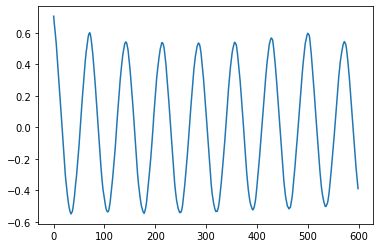

In [103]:
plt.plot(correlations)